gramian angular field - create image from text data descriptors

https://www.google.com/search?q=ramean+angular+field&rlz=1C1CHBF_enUS891US891&oq=ramean+angular+fie&aqs=chrome.1.69i57j33i10i160l2.8105j0j7&sourceid=chrome&ie=UTF-8

https://medium.com/analytics-vidhya/encoding-time-series-as-images-b043becbdbf3

https://www.mdpi.com/1424-8220/21/18/6023

## Imports

In [ ]:
try:
    import utils
except:
    ! pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import gdown
from google.colab import drive
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import argparse
import utils
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import requests
import zipfile
import os
import shutil
import pandas as pd
from scipy.cluster.vq import whiten
from scipy.cluster.vq import kmeans
from sklearn.cluster import KMeans

## Download Images

In [ ]:
folder = "ICE 06 Pictures/"
if not os.path.isdir(folder):
    gdown.download_folder("https://drive.google.com/drive/folders/1RNb-PneOLq607WxhcIGsHwmMwL3TrhyW?usp=sharing", quiet=False, use_cookies=False)
    shutil.move("/content/ICE 06 Pictures/images.zip", "images.zip")

Retrieving folder list


Processing file 1HNGvwx4V0MWRjTqdic38jXc5utdLpNFK faceimg.jpg
Processing file 1RDlNHt4Lsc3vMDM6OnPr94rJBz3J-IlM images.zip
Processing file 1xxVOze7VbJgB0sAkLXn45L3YUrDVUzBn volcano.jpg
Building directory structure completed


Retrieving folder list completed
Building directory structure
Downloading...
From: https://drive.google.com/uc?id=1HNGvwx4V0MWRjTqdic38jXc5utdLpNFK
To: /content/ICE 06 Pictures/faceimg.jpg
100%|██████████| 55.7k/55.7k [00:00<00:00, 43.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1RDlNHt4Lsc3vMDM6OnPr94rJBz3J-IlM
To: /content/ICE 06 Pictures/images.zip
100%|██████████| 1.02M/1.02M [00:00<00:00, 26.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xxVOze7VbJgB0sAkLXn45L3YUrDVUzBn
To: /content/ICE 06 Pictures/volcano.jpg
100%|██████████| 734k/734k [00:00<00:00, 60.5MB/s]
Download completed


## ICE-6 Color features and histogram
Please download the following images for the ICE-6:<br>
https://drive.google.com/file/d/136KacYJQZ3ShMSDndqgzohTlTPrfKuma/view?usp=sharing

In [ ]:
with zipfile.ZipFile("images.zip", "r") as file:
    file.extractall("")

root_dir = "images/"
for (root, folder, files) in os.walk(root_dir):
    for f in files:
        shutil.copy("%s%s"%(root_dir, f), f)

## (Tutorial) Dominant colors
Please refer to the following link to learn how to extract dominant colors of a given image:<br>
https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/

## Example 1. Extracting dominant colors

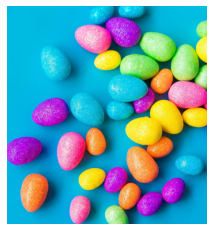

In [ ]:
# load the image and convert it from BGR to RGB so that
# we can dispaly it with matplotlib
image = cv2.imread("eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)

In [ ]:
# reshape the image to proper version for the following processing
image = image.reshape((image.shape[0] * image.shape[1], 3))

In [ ]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 10)
clt.fit(image)

KMeans(n_clusters=10)

In [ ]:
def centroid_histogram(clt):
# grab the number of different clusters and create a histogram
# based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
# normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
# return the histogram
    return hist

In [ ]:
def plot_colors(hist, centroids):
# initialize the bar chart representing the relative frequency
# of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
# loop over the percentage of each cluster and the color of
# each cluster
    for (percent, color) in zip(hist, centroids):
# plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

# return the bar chart
    return bar

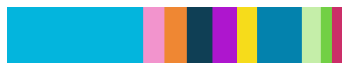

In [ ]:
# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## (Tutorial) Within-Cluster Sum of Square (wcss) and Elbow method
Please refer to the following link to learn Elbow method for optimal number of clusters selecting:<br>
https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/

## Task 1. Using the Elbow method to select the optimal number of clusters for the three images in your downloaded zip file
1. Selecting the optimal number of clusters using Elbow method
2. Visualizing the histogram of clusters as shown in example 1 with the optimal number of clusters

In [ ]:
# Load images
img1 = cv2.imread("Nepal.jpg")
img2 = cv2.imread("boy.jpg")
img3 = cv2.imread("eggs.jpg")

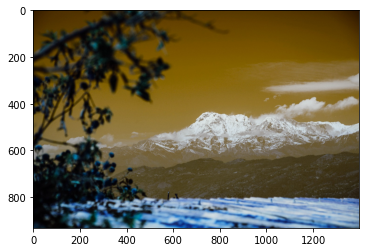

In [ ]:
plt.imshow(img1)

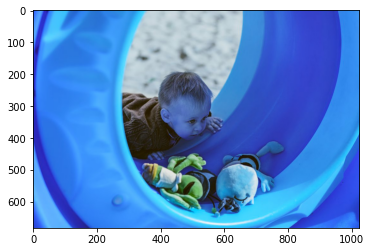

In [ ]:
plt.imshow(img2)

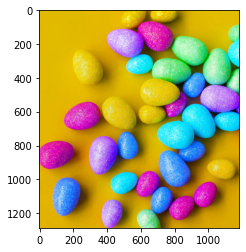

In [ ]:
plt.imshow(img3)

In [ ]:
# Reshape
img1_reshaped = img1.reshape((img1.shape[0] * img1.shape[1], 3))
img2_reshaped = img2.reshape((img2.shape[0] * img2.shape[1], 3))
img3_reshaped = img3.reshape((img3.shape[0] * img3.shape[1], 3))
imgc_reshaped = np.vstack([img1_reshaped, img2_reshaped, img3_reshaped])    # Combine all 3 images

In [ ]:
# Try cluster ammounts
clusters_max = 10

# img1
img1_wcss = []
for i in range(1, clusters_max+1):
    km = KMeans(n_clusters=i, init="k-means++", random_state=42)
    km.fit(img1_reshaped)
    img1_wcss.append(km.inertia_)

# img2
img2_wcss = []
for i in range(1, clusters_max+1):
    km = KMeans(n_clusters=i, init="k-means++", random_state=42)
    km.fit(img2_reshaped)
    img2_wcss.append(km.inertia_)

# img3
img3_wcss = []
for i in range(1, clusters_max+1):
    km = KMeans(n_clusters=i, init="k-means++", random_state=42)
    km.fit(img3_reshaped)
    img3_wcss.append(km.inertia_)

# imgc
imgc_wcss = []
for i in range(1, clusters_max+1):
    km = KMeans(n_clusters=i, init="k-means++", random_state=42)
    km.fit(imgc_reshaped)
    imgc_wcss.append(km.inertia_)

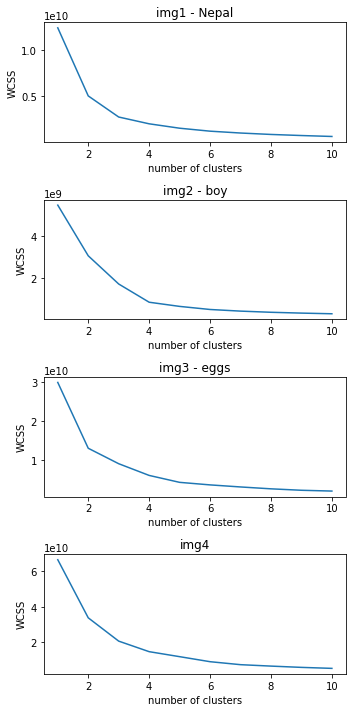

In [ ]:
# Plot elbow plots
fig, ax = plt.subplots(4, 1, figsize=(5, 10))

# img1
ax[0].plot(range(1, clusters_max+1), img1_wcss)
ax[0].set_title("img1 - Nepal")
ax[0].set_xlabel("number of clusters")
ax[0].set_ylabel("WCSS")

# img2
ax[1].plot(range(1, clusters_max+1), img2_wcss)
ax[1].set_title("img2 - boy")
ax[1].set_xlabel("number of clusters")
ax[1].set_ylabel("WCSS")

# img3
ax[2].plot(range(1, clusters_max+1), img3_wcss)
ax[2].set_title("img3 - eggs")
ax[2].set_xlabel("number of clusters")
ax[2].set_ylabel("WCSS")

# imgc
ax[3].plot(range(1, clusters_max+1), imgc_wcss)
ax[3].set_title("img4")
ax[3].set_xlabel("number of clusters")
ax[3].set_ylabel("WCSS")

plt.tight_layout()
plt.show()

Elbow Points:

* img1: 3
* img2: 4
* img3: 2-ish
* imgc: 3

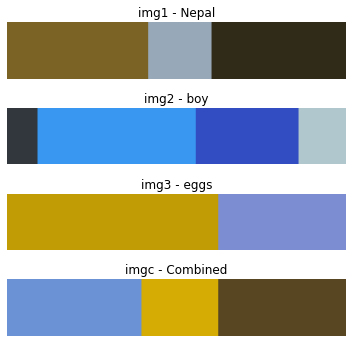

In [ ]:
# Re-cluster
fig, ax = plt.subplots(4, 1, figsize=(5, 5))

# img1
n = 3
img1_km = KMeans(n_clusters=n, init="k-means++", random_state=42)
img1_y = img1_km.fit(img1_reshaped)
hist = centroid_histogram(img1_km)
bar = plot_colors(hist, img1_km.cluster_centers_)
# plt.figure()
ax[0].axis("off")
ax[0].set_title("img1 - Nepal")
ax[0].imshow(bar)

# img2
n = 4
img2_km = KMeans(n_clusters=n, init="k-means++", random_state=42)
img2_y = img2_km.fit(img2_reshaped)
hist = centroid_histogram(img2_km)
bar = plot_colors(hist, img2_km.cluster_centers_)
# plt.figure()
ax[1].axis("off")
ax[1].set_title("img2 - boy")
ax[1].imshow(bar)

# img3
n = 2
img3_km = KMeans(n_clusters=n, init="k-means++", random_state=42)
img3_y = img3_km.fit(img3_reshaped)
hist = centroid_histogram(img3_km)
bar = plot_colors(hist, img3_km.cluster_centers_)
# plt.figure()
ax[2].axis("off")
ax[2].set_title("img3 - eggs")
ax[2].imshow(bar)

# imgc
n = 3
imgc_km = KMeans(n_clusters=n, init="k-means++", random_state=42)
imgc_y = imgc_km.fit(imgc_reshaped)
hist = centroid_histogram(imgc_km)
bar = plot_colors(hist, imgc_km.cluster_centers_)
# plt.figure()
ax[3].axis("off")
ax[3].set_title("imgc - Combined")
ax[3].imshow(bar)

plt.tight_layout()
plt.show()

## Question 1. According to the Elbow method, how to choose the optimal number of clusters?

**Answer to Q1**: A good starting estimate is three, as that's the number of clusters that appears the most (and the two that aren't three could be argued to that number). 

As to the method, first cluster on the image a number of times, each time trying a different number of clusters. For each attempt, collect the wcss score. Once this is done plot the wcss score vs. the number of clusters. Look for the point on the line graph where the line makes the sharpest turn, going from mostly-vertical to mostly-horizontal (as much as can be observed from the graph). At this point is the optimal number of clusters for the image.


---

## (Tutorial) Histogram Equalization
Please refer to the following link to learn the histogram equalization:<br>
https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 <br> and 
https://hypjudy.github.io/2017/03/19/dip-histogram-equalization/

## Example 2. Histogram equalization on gray image

In [ ]:
img = cv2.imread('Nepal.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
print("Gray Image")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

Output hidden; open in https://colab.research.google.com to view.

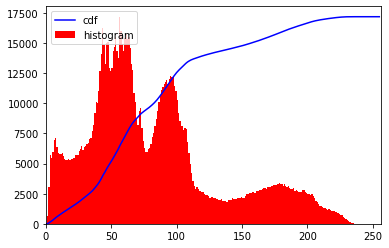

In [ ]:
hist,bins = np.histogram(gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

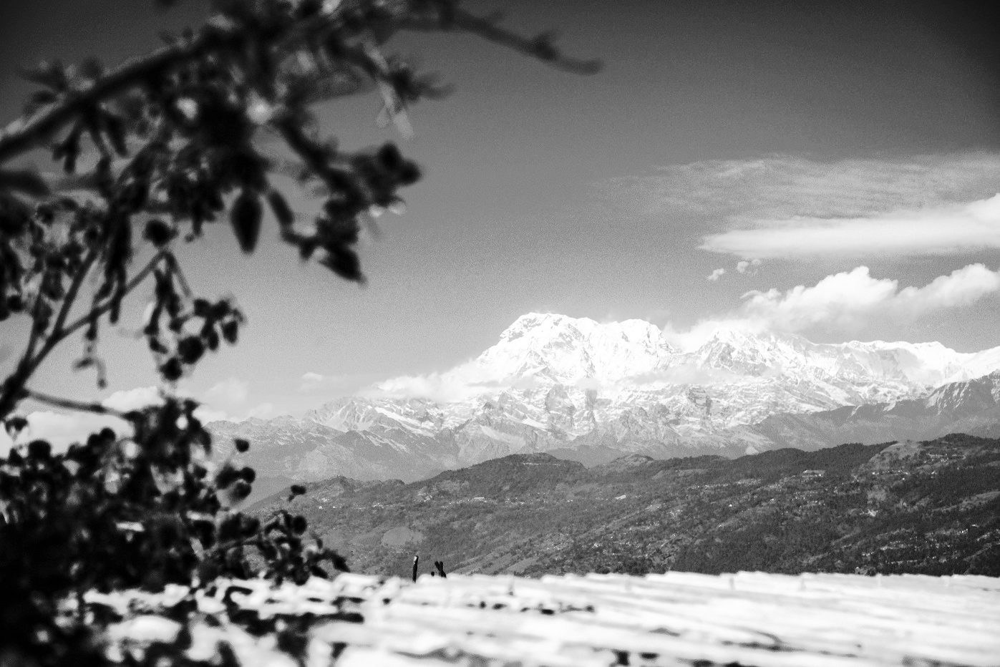

In [ ]:
equ = cv2.equalizeHist(gray)
cv2_imshow(equ)
cv2.waitKey(0)
cv2.destroyAllWindows()

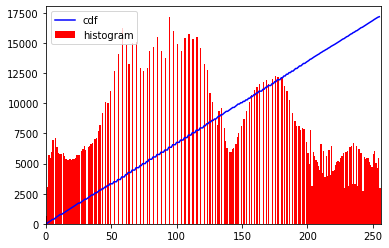

In [ ]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()



```
# This is formatted as code
```

## Task 2. Histogram equalization on color images
1. Apply histogram equalization on the 3 downloaded images
2. Visualize the histograms and the cumulative summation before and after histogram equalization
3. Show the images before and after histogram equalization

In [ ]:
cv2_imshow(img1)

Output hidden; open in https://colab.research.google.com to view.

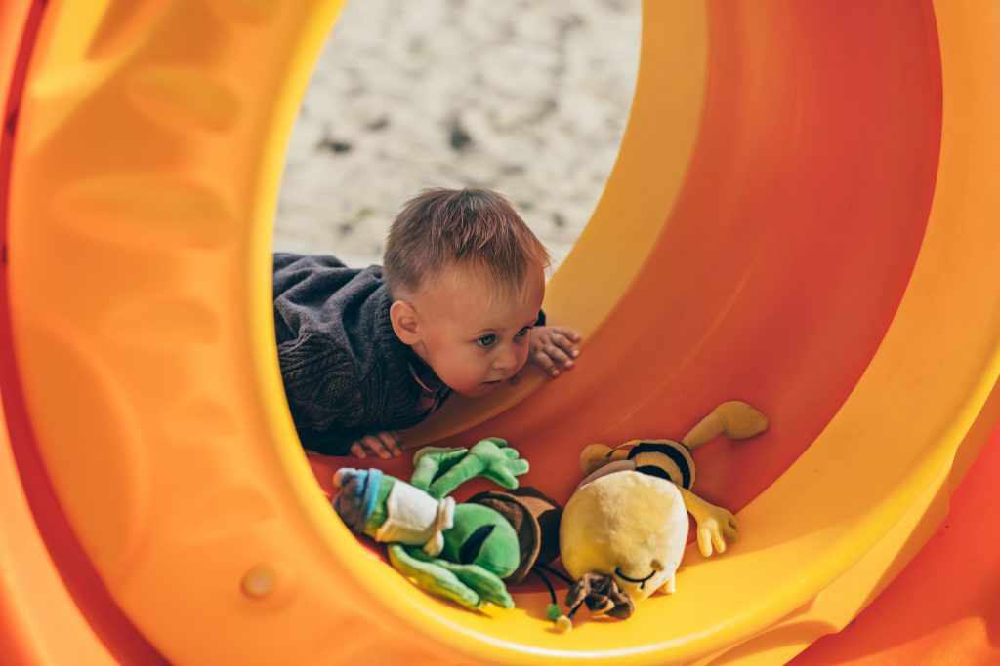

In [ ]:
cv2_imshow(img2)

In [ ]:
cv2_imshow(img3)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Convert to grayscale
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

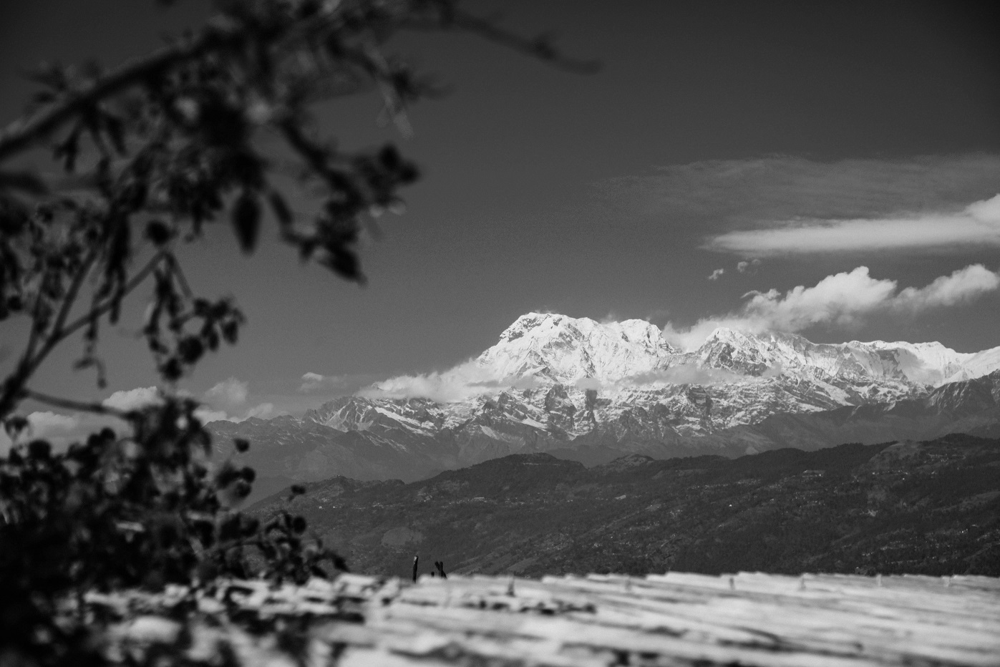

In [ ]:
cv2_imshow(img1_gray)

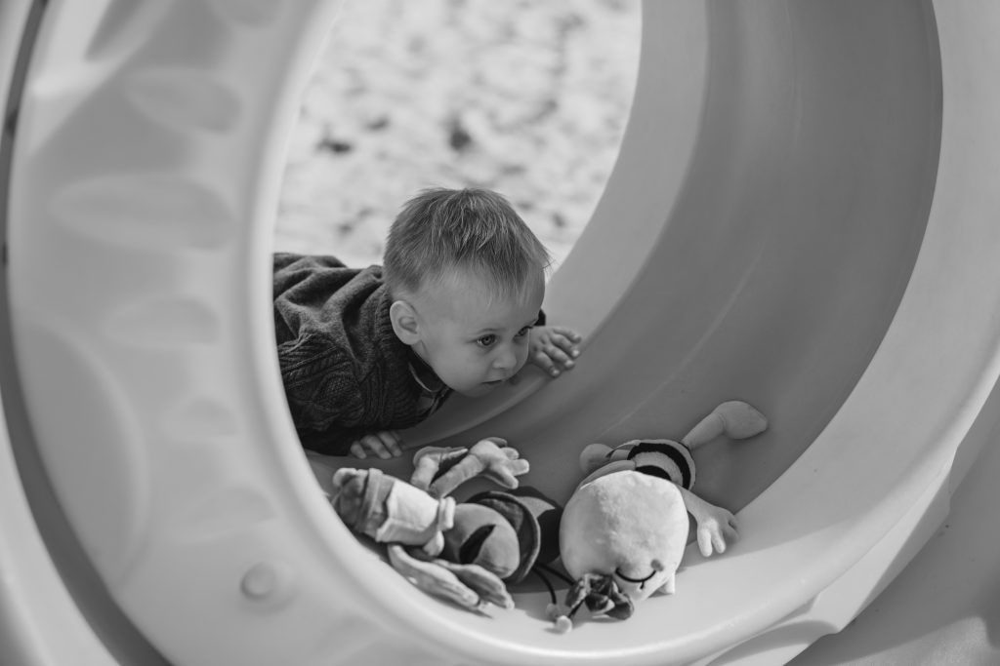

In [ ]:
cv2_imshow(img2_gray)

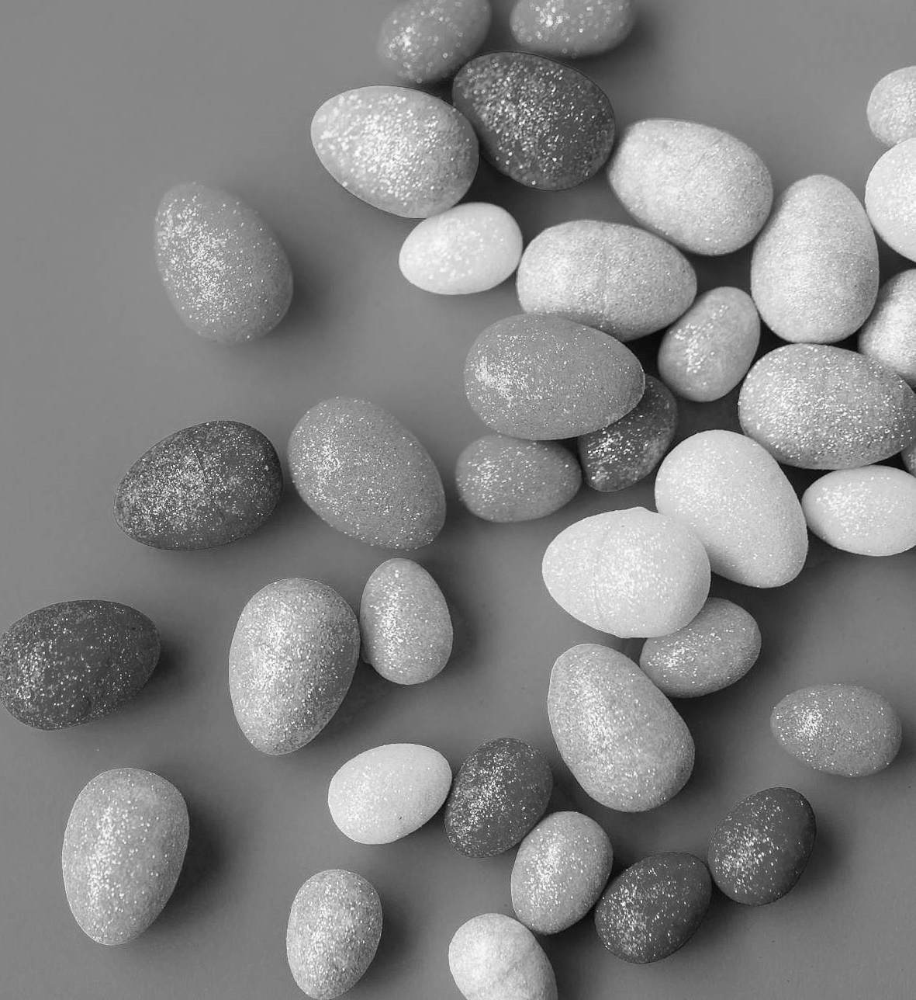

In [ ]:
cv2_imshow(img3_gray)

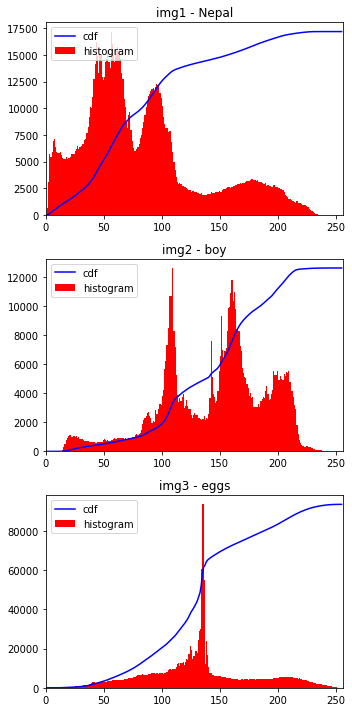

In [ ]:
# Cumulative histograms of grayscale images
fix, ax = plt.subplots(3, 1, figsize=(5, 10))

# img1
hist, bins = np.histogram(img1_gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[0].plot(cdf_normalized, color="b")
ax[0].hist(img1_gray.flatten(), 256, [0, 256], color="r")
ax[0].set_xlim([0, 256])
ax[0].set_title("img1 - Nepal")
ax[0].legend(("cdf", "histogram"), loc="upper left")

# img2
hist, bins = np.histogram(img2_gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[1].plot(cdf_normalized, color="b")
ax[1].hist(img2_gray.flatten(), 256, [0, 256], color="r")
ax[1].set_xlim([0, 256])
ax[1].set_title("img2 - boy")
ax[1].legend(("cdf", "histogram"), loc="upper left")

# img3
hist, bins = np.histogram(img3_gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[2].plot(cdf_normalized, color="b")
ax[2].hist(img3_gray.flatten(), 256, [0, 256], color="r")
ax[2].set_xlim([0, 256])
ax[2].set_title("img3 - eggs")
ax[2].legend(("cdf", "histogram"), loc="upper left")

plt.tight_layout()
plt.show()

In [ ]:
# Equalize grayscale images
img1_equ = cv2.equalizeHist(img1_gray)
img2_equ = cv2.equalizeHist(img2_gray)
img3_equ = cv2.equalizeHist(img3_gray)

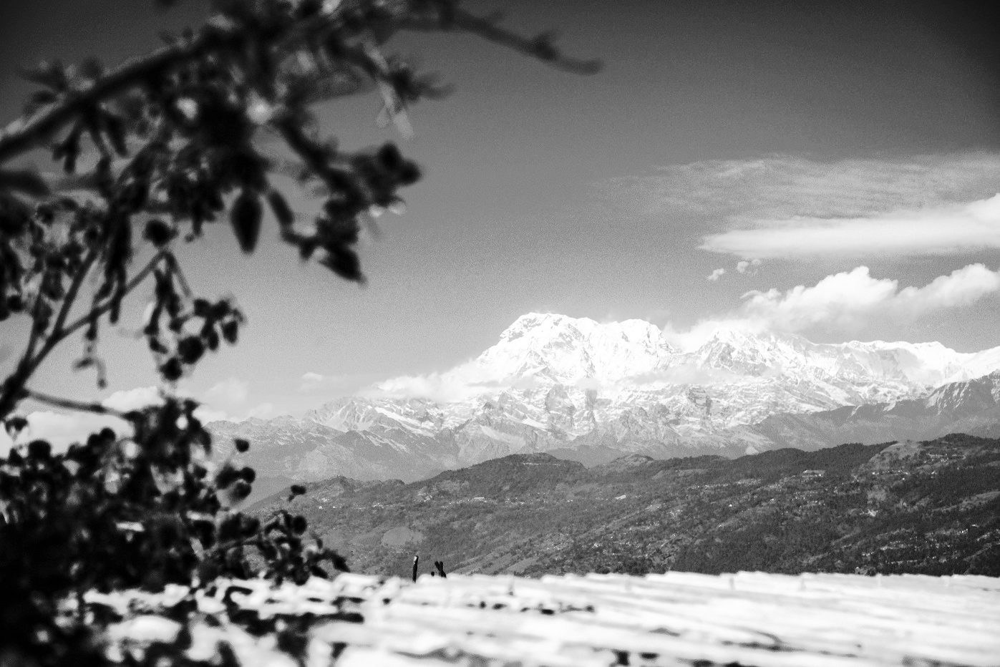

In [ ]:
cv2_imshow(img1_equ)

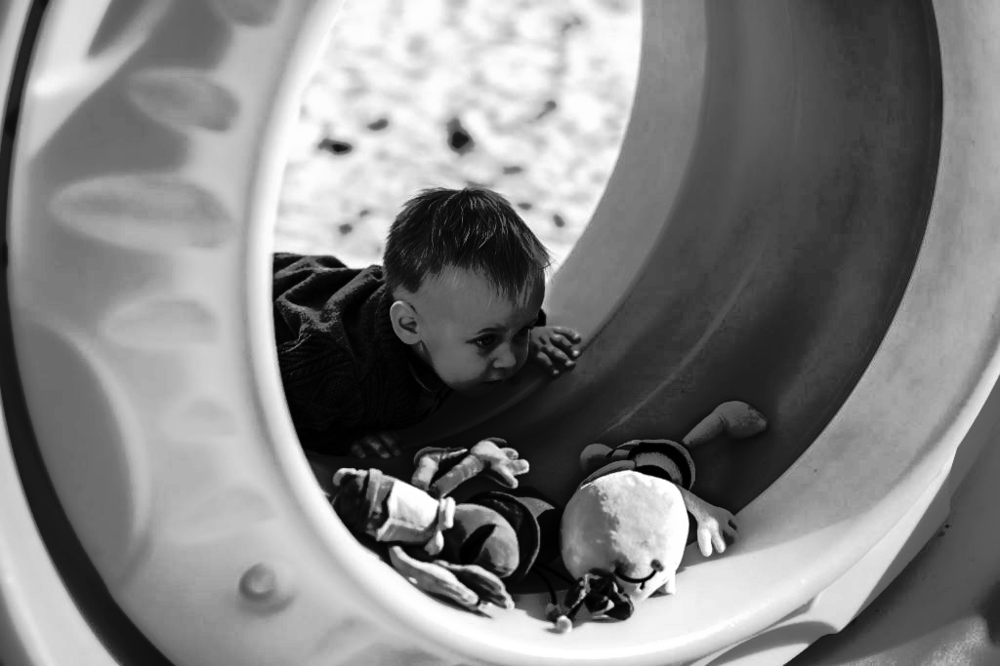

In [ ]:
cv2_imshow(img2_equ)

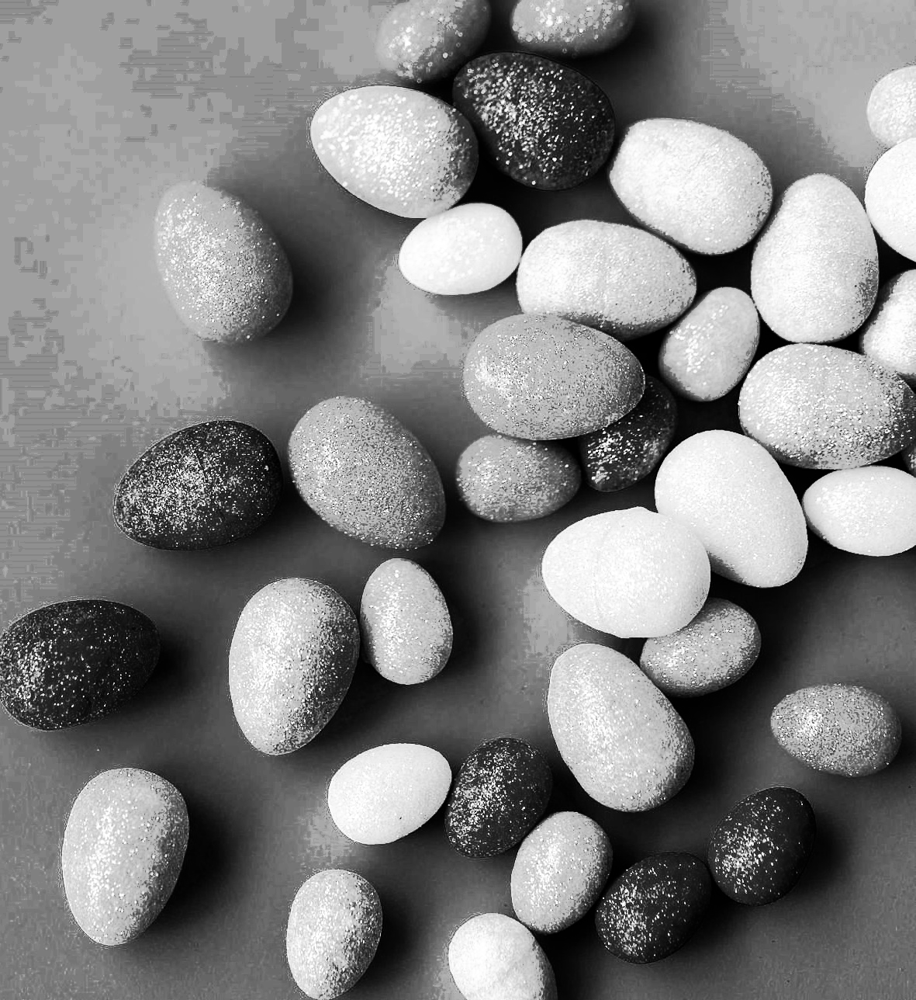

In [ ]:
cv2_imshow(img3_equ)

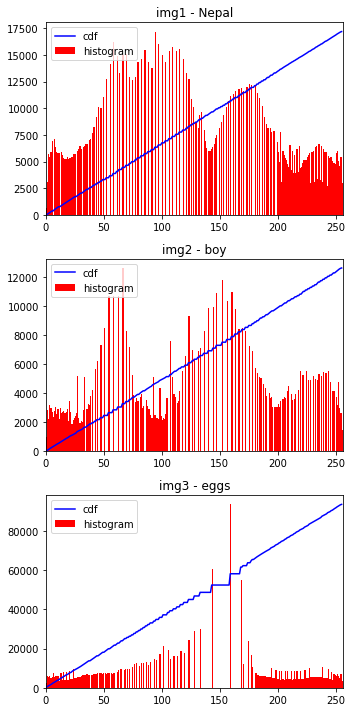

In [ ]:
# Cumulative histograms of equalized grayscale images
fix, ax = plt.subplots(3, 1, figsize=(5, 10))

# img1
hist, bins = np.histogram(img1_equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[0].plot(cdf_normalized, color="b")
ax[0].hist(img1_equ.flatten(), 256, [0, 256], color="r")
ax[0].set_xlim([0, 256])
ax[0].set_title("img1 - Nepal")
ax[0].legend(("cdf", "histogram"), loc="upper left")

# img2
hist, bins = np.histogram(img2_equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[1].plot(cdf_normalized, color="b")
ax[1].hist(img2_equ.flatten(), 256, [0, 256], color="r")
ax[1].set_xlim([0, 256])
ax[1].set_title("img2 - boy")
ax[1].legend(("cdf", "histogram"), loc="upper left")

# img3
hist, bins = np.histogram(img3_equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
ax[2].plot(cdf_normalized, color="b")
ax[2].hist(img3_equ.flatten(), 256, [0, 256], color="r")
ax[2].set_xlim([0, 256])
ax[2].set_title("img3 - eggs")
ax[2].legend(("cdf", "histogram"), loc="upper left")

plt.tight_layout()
plt.show()

## Question 2. Why don't we apply histogram equalization on each color channel separately to implement histogram equalization on color images?



```
# This is formatted as code
```

**Answer to Q2**: type your answer here


## Task 3. Convert RGB image to Ycbcr from opencv 

Use any rgb image and share it from your google drive as shareable link and use it here 

In [ ]:
folder = "ICE 06 Pictures/"

In [ ]:
v_name = "volcano.jpg"
if not os.path.exists(v_name):
    shutil.copy(folder + v_name, v_name)

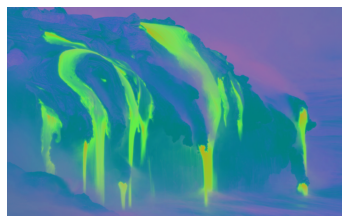

In [ ]:
imgv = cv2.imread(v_name)
imgv_convert = cv2.cvtColor(imgv, cv2.COLOR_BGR2YCR_CB)
plt.figure()
plt.axis("off")
plt.imshow(imgv_convert)

## Task 4. Design code to implement Features from Accelerated Segment Test (FAST)

Keep your face image file name as **faceimg.jpg**
Save it in drive and use get shareable link to everyone option.

Please print the following during the implementation

* Original Image (faceimg.jpg)

* Gray Image (of original image)

* Number of Keypoints Detected In The Image With Non Max Suppression (Not just number image too)

* Number of Keypoints Detected In The Image Without Non Max Suppression (Not just number image too)


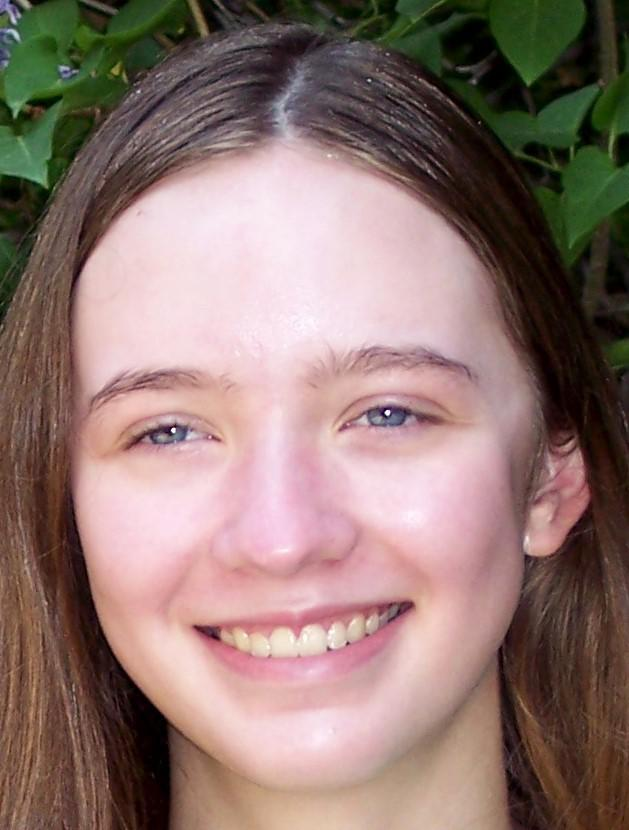

In [ ]:
# Load image
f_name = "faceimg.jpg"
if not os.path.exists(f_name):
    shutil.copy(folder + f_name, f_name)
imgf = cv2.imread(f_name)
cv2_imshow(imgf)

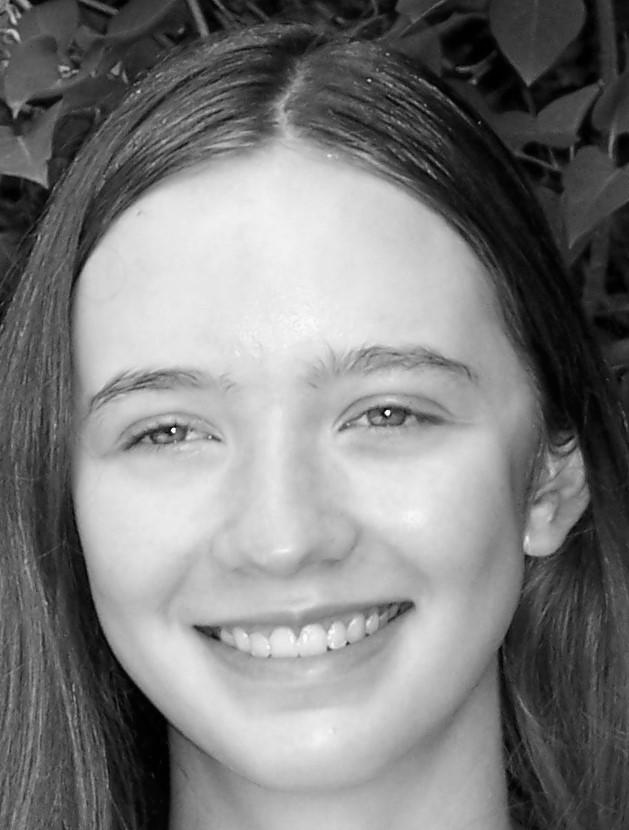

In [ ]:
# Convert to grayscale
imgf_gray = cv2.cvtColor(imgf, cv2.COLOR_BGR2GRAY)
cv2_imshow(imgf_gray)

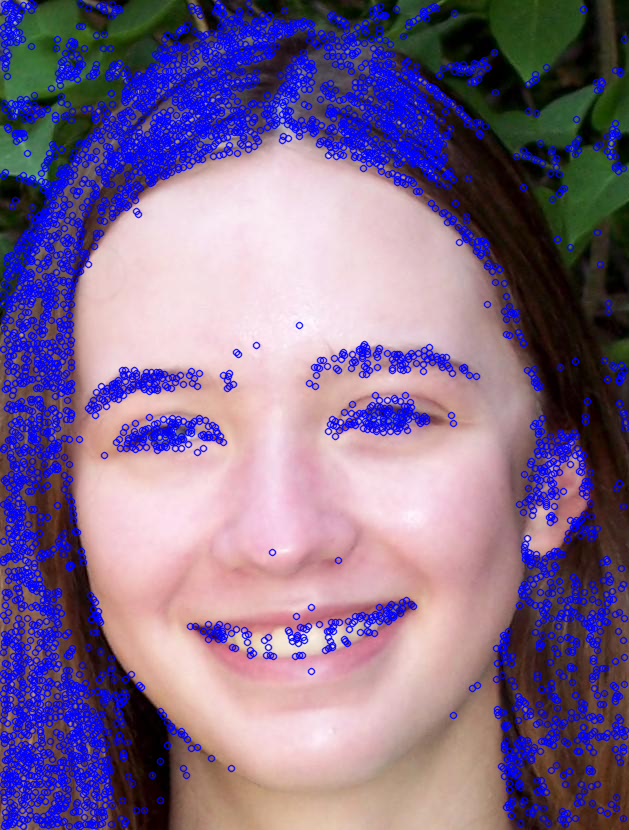

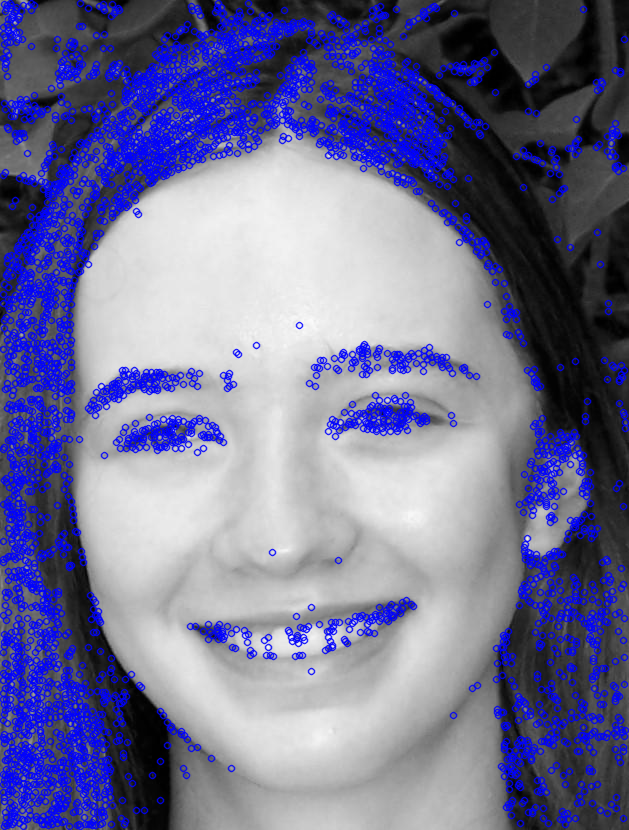

In [ ]:
# Keypoints with nonmax suppression
fast = cv2.FastFeatureDetector.create(threshold=10, nonmaxSuppression=True)

# Color
kp = fast.detect(imgf, None)
imgf_k = cv2.drawKeypoints(imgf, kp, None, color=(255, 0, 0))
cv2_imshow(imgf_k)

# Grayscale
kp = fast.detect(imgf_gray, None)
imgf_k = cv2.drawKeypoints(imgf_gray, kp, None, color=(255, 0, 0))
cv2_imshow(imgf_k)

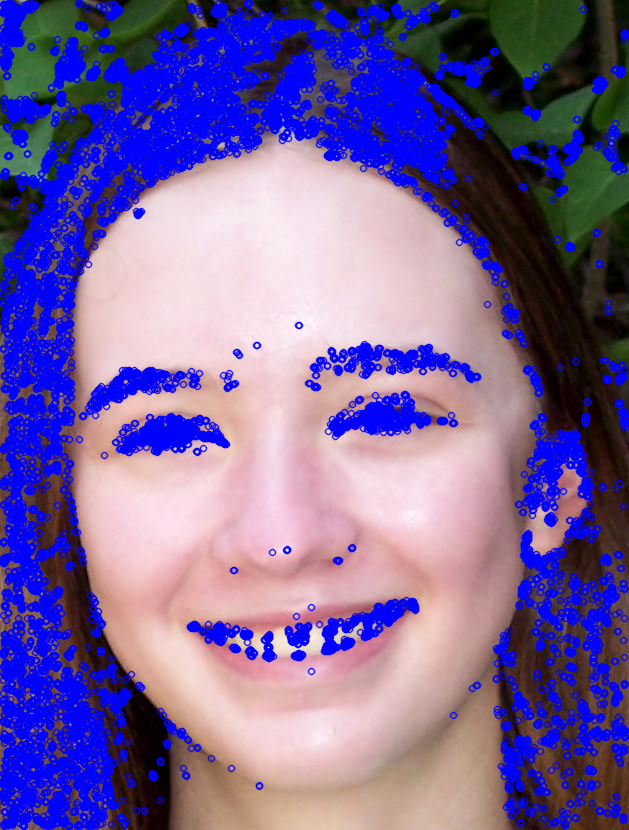

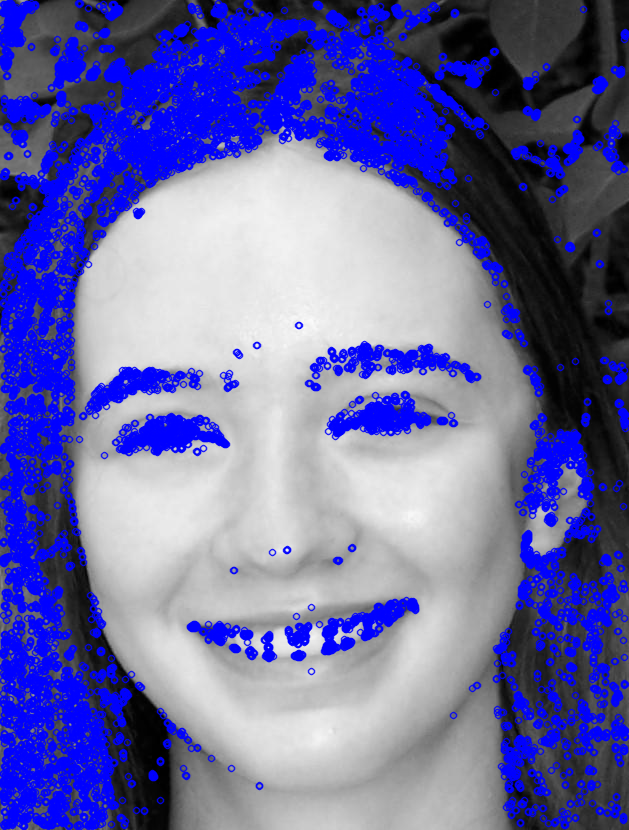

In [ ]:
# Keypoints without nonmax suppression
fast = cv2.FastFeatureDetector.create(threshold=10, nonmaxSuppression=False)

# Color
kp = fast.detect(imgf, None)
imgf_k = cv2.drawKeypoints(imgf, kp, None, color=(255, 0, 0))
cv2_imshow(imgf_k)

# Grayscale
kp = fast.detect(imgf_gray, None)
imgf_k = cv2.drawKeypoints(imgf_gray, kp, None, color=(255, 0, 0))
cv2_imshow(imgf_k)

## Question 3. Difference between MPEG 4 and MPEG 7 

**Answer to Q3**: MPEG 1 has a video resolution of 352 by 240 pixels at 30 fps, and is the standeard for digital video compression. This format is often used to transmit videos.

MPEG 7 contains more information, both video and audio are broken down into multiple descriptors that a computer can interpert into a video or work with for some other purpose. Each descriptor can be worked with, modified, or interpreted individually. This allows the file to be much more searchable, as the descriptor fields provide information that a query can look at.


## Question 4. 

Whats MPEG 21 ? 

Whats the Purpose of MPEG 21 ?

Applications of MPEG 21?

**Answer to Q4**: MPEG 21 is the standard used for delivery of multimedia across device platfomrs, e.g. DVD playeres, computers, and phones.

The primary purpose of MPEG 21 is to allow for multimeida to be accessed on different platforms without modification to the information contained in the file. The hardware in a DVD plyaer, for example, can parse the file the same way that a computer does. MPEG 21 is an alternate for proprietary formats.

MPEG 21 can be used for any video or audio files. Applications such as cross-platform video and music streaming, highly serchable files, handling high-quality data storage for video and audio, etc. are common uses of MPEG 21.